# 🐶 end to end multi-class dog breed classificaton

## 1. Problem 
identify dog breed with given dog image

## 2. Data
 data using from kaggle's dog breed 
 identification competition
 https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

evaluation of prediction probability for each dog for each image

## 4. Features
we dealing with image(unstructured data) 
so it's probably best we use deep learning/transfer learning.

*  there are 120 breeds of dogs(means 120 diffrent classes)

* 10000 image for training 
(these images have labels)
* 10000 for test
(these image have no labels)


In [129]:
# !unzip "/content/drive/MyDrive/dog-vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog-vision/"

In [130]:
# import tensorflow into colab
# import tensorflow_hub
import tensorflow as tf
import tensorflow_hub as hub
print('tf version:',tf.__version__)
print('th vsersion:',hub.__version__)

# check for gpu availability
print("GPU","available (Yess!!!!!)"  if tf.config.list_physical_devices("GPU") else "not available")

tf version: 2.8.0
th vsersion: 0.12.0
GPU not available


## getting our data ready (turning into tensors)

with all machine learning models , our data has to in numerical format , turning into images into tensors(numberical representation)


let's start by accessing data and check labels

In [131]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [132]:
# checkout the label of our data
import pandas as pd
label_csv = pd.read_csv('/content/drive/MyDrive/dog-vision/labels.csv')
print(label_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [133]:
label_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


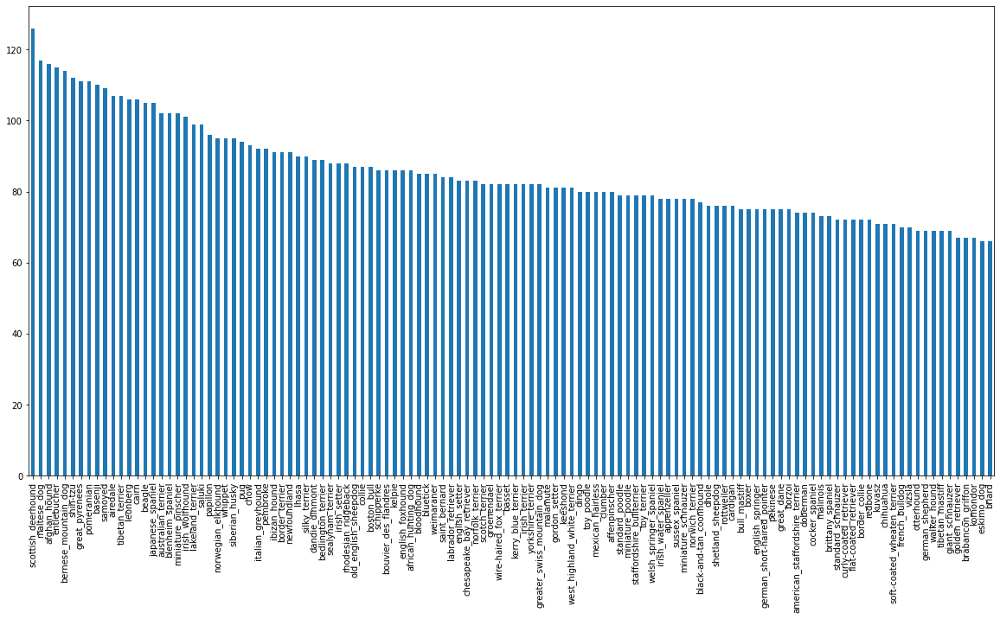

In [134]:
# how many image are there of each breed?
label_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [135]:
label_csv['breed'].value_counts().median()

82.0

max image for one classes 

## https://cloud.google.com/vision/automl/object-detection/docs/prepare

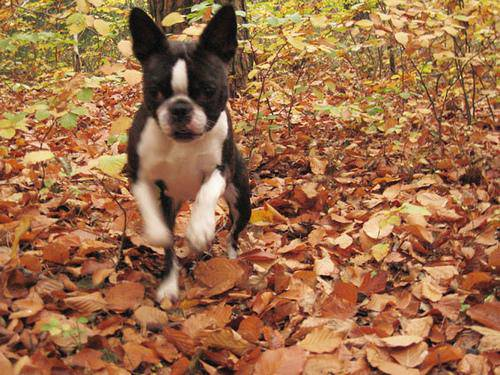

In [136]:
# let's view an image
from IPython.display import Image
Image('/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [137]:
# create pathname from image ids
filenames = [fname for fname in label_csv['id']]
filenames 

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [138]:
import os
os.listdir("/content/drive/MyDrive/dog-vision/train/")

['de41f775f1b52a040d0965e0923bc983.jpg',
 'e1be68b2576ddfceabb23d33ee9e07ef.jpg',
 'e3d9ae0a1ff03eeb37b6ca4bce7bad97.jpg',
 'decaf524b73836c58c7eb371cce2b980.jpg',
 'e5e49ed50cc1f2a58f1fca768a977391.jpg',
 'dbbdbfbe8184ff95c6f9f6838b0aefb8.jpg',
 'e34ee9dce9546a1b520c1c8a3badb605.jpg',
 'e2b39eb9cb8b34303cc3527f8f8df9d6.jpg',
 'e308be2d0ae640f51c08166b2e3ce396.jpg',
 'dec0bb81afcfc4c35c7c6790975e5633.jpg',
 'dfe45c3b288b8224eb17dbdaf1706496.jpg',
 'e1466949f06f43556943189409054b1c.jpg',
 'e4913c578cba8c59d842663fa734d337.jpg',
 'e0c78ec8516f29e1b0a94ba500bcefbc.jpg',
 'e56ce32aeccac2bfbbcd6eb80ab337da.jpg',
 'e8b700408541ef85238927b90b33df67.jpg',
 'e8e9ea1506e0ad9382665b2690ecb4e9.jpg',
 'e960fc18473c0998c1ecbda887aa6bea.jpg',
 'df3ba5eee0c008a3284158bb89350673.jpg',
 'e7c5692d044250d303a839d989132bf1.jpg',
 'e7a8a3681524405b2e987ffbaff6d173.jpg',
 'e673bb6ca717b8dffe3b5ba35da07a83.jpg',
 'e2e10aeca2bcd6e9d9d91cd64efc13a8.jpg',
 'dcf871b987529e8b80b6e058e6150691.jpg',
 'e73d792517b5e7

In [139]:
# create pathname from image ids
filenames = ["/content/drive/MyDrive/dog-vision/train/"+fname+'.jpg' for fname in label_csv['id']]
filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [140]:
# check wheater number of filenames matches number of actual image files
import os

if len(os.listdir("/content/drive/MyDrive/dog-vision/train/")) == len(filenames):
  print('file match acutal amount to file')
else:
  print('filenames not same')

file match acutal amount to file


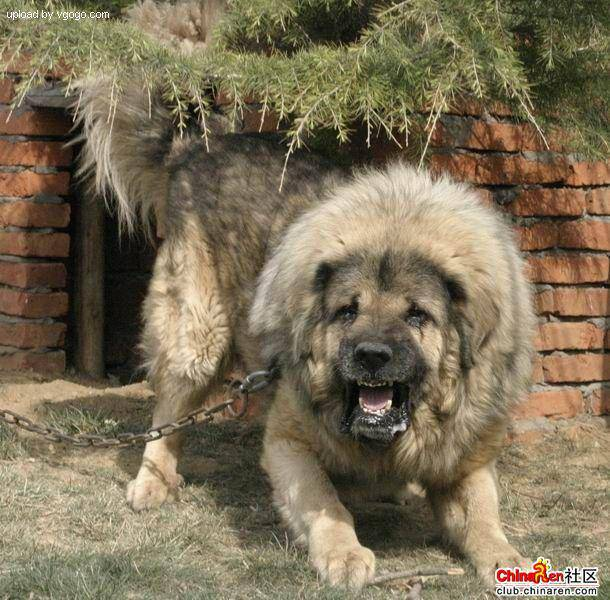

In [141]:
# one more check
Image(filenames[9000])

In [142]:
label_csv['breed'][9000]

'tibetan_mastiff'

## we got our training image filepath in list, now to prepare our labels

In [143]:
import numpy as np
labels = label_csv['breed'].to_numpy() # 1
# labels = np.array(labels) # 2  (1 and 2 are same)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [144]:
len(labels)

10222

In [145]:
# see if number of labels matches the number of filename
if len(labels) == len(filenames):
  print('same')
else:
  print('not same')  

same


In [146]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [147]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [148]:
len(labels)

10222

In [149]:
# turn every label into a boolean array
boolean_label = [label == unique_breeds for label in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [150]:
len(boolean_label)

10222

In [151]:
# example turning boolean array into integre
print(labels[0]) # original label => breed
print(np.where(unique_breeds == labels[0])) # index of both same
print(boolean_label[0].argmax()) # index where label occurs in boolean array
print(boolean_label[0].astype(int)) # bolean to integer

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [152]:
print(labels[2])
print(boolean_label[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [153]:
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [154]:
filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## create our own validation set

since the dataset from kaggle does not come with a validation set we are going to create our own

In [155]:
# setup x,y variables
x = filenames
y = boolean_label

In [156]:
len(labels)

10222


we are going to start off exprimenting with ~1000 images and increase as needed

In [157]:
# set number of image to use for experimenting
num_image = 1000 #@param {type:"slider", min:1000, max:10000, step:1}

In [158]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split


# split them into training and validation of total size num_image
x_train,x_val,y_train,y_val = train_test_split(x[:num_image],
                                               y[:num_image],
                                               test_size=0.2,
                                               random_state=42)

len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [159]:
# let's have a geeze at time training data
x_train[:5],y_train[:2]

(['/content/drive/MyDrive/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## preprocessing images(turning image into tensors)

1. take an image filepath as input
2. use tensorflow to read the file and save it to a variable , `image`
3. turn our `image` ( a jpg) into tensors
4. resize the `image` to be shape (224,224)
5. return the modified `image`

In [160]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [161]:
image.max(),image.min()

(255, 0)

In [162]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [163]:
# turn image into tensor 
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

## now we have see what an image looks like as tensor,let's make a function to preprocess them. 

1. take an image filepath as input
2. use tensorflow to read the file and save it to a variable , `image`
3. turn our `image` ( a jpg) into tensors
4. normalize our image (convert color channel values from 0-255 to 0-1)
5. resize the `image` to be shape (224,224)
6. return the modified `image`

In [164]:
tensor = tf.io.read_file(filenames[26])


In [165]:
image = tf.image.decode_jpeg(tensor,channels=3)

In [166]:
image=tf.image.convert_image_dtype(image,tf.float32)

In [167]:
img_size=224
image = tf.image.resize(image,size=[img_size,img_size])


In [168]:
# Define image size
img_size=224

  # create a function for preprocessing images

def process_image(image_path,image_size=img_size):
    """
    take image file path and convert into tensro.
    """

    # read in image file
    image = tf.io.read_file(image_path)
    # turn the jpeg image into numberical tensor with 3 colour channels (red,green,blue)
    image = tf.image.decode_jpeg(image,channels=3)
    #convert the color channel values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image,tf.float32)
    # resize the image to our desired value (224,224)
    image = tf.image.resize(image,size=[img_size,img_size])

    return image

## turning our data into batches

why turn our data into batches?

let's say 10000 images is not fit to into memory

so 32(batch size) images at a time you can adjust batch size if need be.

in order to use tensorflow effectively, we
need our data in the form of tensor tuples which look liks this: `(image,label)`

In [169]:
## create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  take an image file path name and the associated label,
  processes the image and return a tuple of (image,label) 
  """

  image = process_image(image_path)
  return image,label

In [170]:
# demo of above
(process_image(x[42]),tf.constant(y[42]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## convert data input tuple of tensor in form:`(image,label)`. let's make a function to turning into batches 

In [171]:
# define batch size
batch_size=32

# create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=batch_size,valid_data=False,test_data=False):
  """
  create batch of data out of image (x) and lebel(y) pairs.
  shuffles the data if its training data but doesn't shuffle if it's a validation data.
  """
  # if the data is test dataset , we probably don't have labels

  if test_data:
    print('create test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # if data is valid dataset

  elif valid_data:
    print('creating validation data batch')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch                                           

  else:
    print('create training data batches ...')
    # turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                               tf.constant(y))) # labels
    # shufling pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size=len(x))
    #create (image,lable) tupbles 
    data = data.map(get_image_label)
    # turn the training data into batches
    data_batch = data.batch(batch_size)
  return data_batch  

In [172]:
# create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

create training data batches ...
creating validation data batch


In [173]:
# check out the diffrent attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visulizing data batches

our data is now in batches , however, these can be little hard to understand/comprehend, let's visulize them.

In [174]:
import matplotlib.pyplot as plt

# create a function for viewing images in data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # setup the figure
  plt.figure(figsize=(10,10))
  # loop through 25 (for display 25 images)
  for i in range(25):
    #create a subplots (5 rows,5column)
    ax = plt.subplot(5,5,i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    

In [175]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [176]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [177]:
train_image,train_labels=next(train_data.as_numpy_iterator())
len(train_image),len(train_labels)

(32, 32)

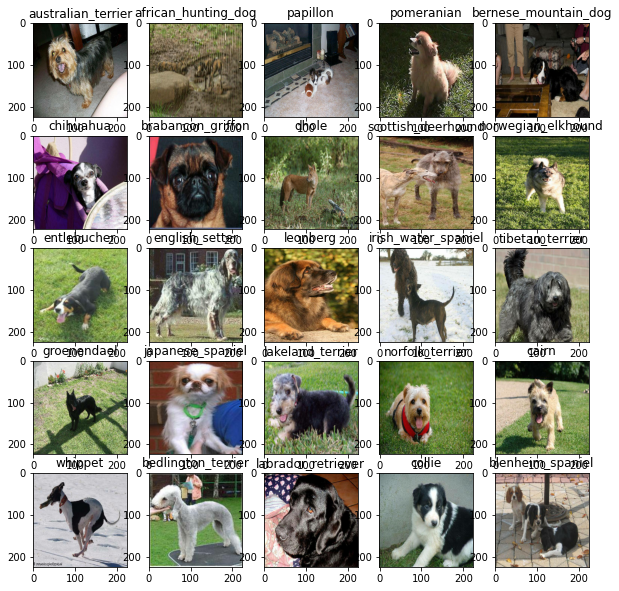

In [178]:
# now let's visulize the data in a training batch
show_25_images(train_image,train_labels)

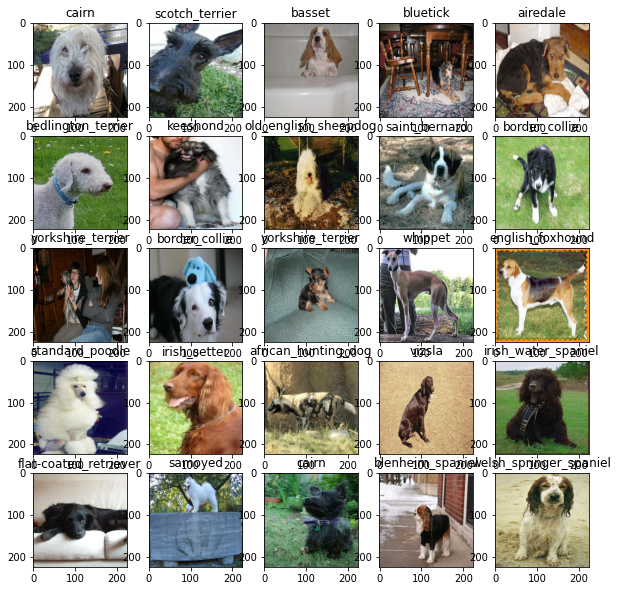

In [179]:
# visulize our validation set
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Building of model

* the input shape (our images shape,in the form of tensors) to our model
* the output shape(image label, in the form of tensors) of our model
* the url of the model we want to use https://tfhub.dev/google/imagenet/mobilenet_v2_035_224/classification/5

In [180]:
 # setup intput shape to the model
 input_shape = [None,img_size,img_size,3] # batch , height,width, colour channels

 # setup output shape of our model
 output_shape = len(unique_breeds)

# setup model url from tensorflow hub
 model_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_035_224/classification/5"

now we have got our input,output and model ready to go . lets put them together into a keras deep learning model!

knowing this. let's create a function which:
* take the input shape,output shape and the model we have chosen as parameter
 
* defines the layers in a keras model in sequential fashion (do this first, then this,then that).
* compiles the model (says it should be evaulated and improved)
* builds the model (tells the model the input shape it will be getting).
* return the model https://www.tensorflow.org/guide/keras/sequential_model

In [181]:
#create a function which build a keras model
def create_model(input_shape=input_shape,output_shape=output_shape,model_url=model_url):
    print('building model with:', model_url)
    #setup the model layers
    model = tf.keras.Sequential([
            hub.KerasLayer(model_url),# layer 1 (input layer)
            tf.keras.layers.Dense(units=output_shape,
                                  activation='Softmax') # layer 2(output layer)

    ])
    # compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
    model.build(input_shape)

    return model

In [182]:
model = create_model()
model.summary()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_035_224/classification/5
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              1692489   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 1,812,729
Trainable params: 120,240
Non-trainable params: 1,692,489
_________________________________________________________________


## create callback

callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

two callbacks
1. tensorBoard=>track our model progress
2. other =>to stopping, model runing long time without progress


## tensorboard callback

to setup a tensorboard callback,we need 3 things:
1. load tensorboard notebook extension
2. create tensorboard callback which is able to save logs to a directory and pass
it to our model's `fit()` function.
3. visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)

In [183]:
# load tensorboard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [184]:
import datetime

# create a function to build a tensorflow  callback
def create_tensorboard_callback():
  # create a log directory for storing logs
  logdir = os.path.join('/content/drive/MyDrive/dog-vision/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### ealy stopping callback

ealy stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [185]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)


## training a model(on subset of data)
our first model is only to train on 1000 images, to make sure everything is working

In [186]:
num_epochs = 100 #@param {type:'slider',min:0,max:100,step:10}

In [187]:
# check gpu availabe or not
print("GPU , available" if tf.config.list_physical_devices("GPU") else "not available:(")

not available:(


### let's create a function which tains a model.
* create a model using create_model()
* setup a tensorboard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data,validation data, number of epochs to train for `(num_epochs)` and
the callbacks we'd like to use
* return the model 

In [188]:
# build a function to train and return a trained model
def train_model():
  """
  train a given model and return the trainde version.
  """
  # create model
  model =  create_model()

  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # fit the model to train data
  model.fit(x=train_data,
            epochs=num_epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # return the fitted model
  return model


In [189]:
# fit the model to the data
model = train_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_035_224/classification/5
Epoch 1/100
25/25 [==============================] - 25s 782ms/step - loss: 5.2323 - accuracy: 0.0737 - val_loss: 3.9597 - val_accuracy: 0.1100
Epoch 2/100
25/25 [==============================] - 11s 451ms/step - loss: 1.9711 - accuracy: 0.5213 - val_loss: 3.0002 - val_accuracy: 0.2750
Epoch 3/100
25/25 [==============================] - 17s 693ms/step - loss: 0.8276 - accuracy: 0.8537 - val_loss: 2.6680 - val_accuracy: 0.3150
Epoch 4/100
25/25 [==============================] - 11s 452ms/step - loss: 0.3891 - accuracy: 0.9675 - val_loss: 2.6473 - val_accuracy: 0.3050
Epoch 5/100
25/25 [==============================] - 11s 434ms/step - loss: 0.2187 - accuracy: 0.9962 - val_loss: 2.6044 - val_accuracy: 0.3350
Epoch 6/100
25/25 [==============================] - 11s 447ms/step - loss: 0.1382 - accuracy: 1.0000 - val_loss: 2.6086 - val_accuracy: 0.3250
Epoch 7/100
25/25 [========================

**Question:** it looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset , what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with a good thing! it means our model is learning!!!

## checking the tensorboard logs
the tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its  contents.

In [190]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

Reusing TensorBoard on port 6006 (pid 8556), started 1:28:43 ago. (Use '!kill 8556' to kill it.)

<IPython.core.display.Javascript object>

## making and evaluating prediction using a trained model

In [191]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [192]:
# make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 285ms/step


array([[1.0414975e-02, 4.0972601e-03, 1.1508228e-05, ..., 1.3134359e-04,
        9.9540257e-04, 3.0338933e-04],
       [9.6937198e-05, 4.6104418e-05, 4.2564454e-03, ..., 2.2560744e-06,
        1.4394865e-04, 1.1258684e-03],
       [1.1981956e-05, 1.4909184e-04, 1.1349434e-04, ..., 4.6352748e-02,
        1.0378918e-03, 4.3089539e-02],
       ...,
       [1.8599792e-05, 2.5888128e-05, 2.1252988e-04, ..., 3.4521951e-04,
        5.0319730e-05, 4.1127560e-04],
       [3.3828840e-03, 4.6001867e-04, 1.8798488e-05, ..., 7.3838717e-05,
        7.2812531e-05, 2.3221613e-04],
       [2.0238088e-04, 4.1848698e-04, 1.1597133e-04, ..., 2.9133204e-03,
        1.2735100e-03, 1.5474955e-03]], dtype=float32)

In [193]:
len(predictions[0])

120

In [194]:
np.sum(predictions[0])

1.0

In [195]:
np.sum(predictions[1])

1.0000001

In [196]:
predictions.shape

(200, 120)

In [197]:
len(y_val)

200

In [198]:
len(unique_breeds)

120

In [199]:
# first prediction
index=42
print(predictions[0])
print(f"max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax([predictions[index]])]}")

[1.04149748e-02 4.09726007e-03 1.15082285e-05 9.36455093e-04
 9.49710142e-04 2.71376077e-04 1.73019664e-03 1.91118106e-05
 2.18614514e-05 4.51967462e-05 1.00820204e-02 4.02679052e-06
 3.73920868e-03 1.73818953e-05 6.86332351e-06 1.57622533e-04
 6.20925712e-05 1.89820081e-02 3.83999635e-04 6.27581176e-06
 1.59842079e-03 1.18144872e-05 2.12099130e-05 3.37873474e-02
 4.99998605e-05 1.10258479e-04 7.48367514e-03 3.13202941e-06
 8.45907343e-05 3.66687309e-05 5.18556277e-04 1.93805166e-03
 9.90169588e-04 1.57484290e-04 1.11167188e-04 1.56326294e-02
 2.85831138e-05 9.82484562e-06 7.11874782e-06 1.34901362e-04
 2.98125367e-03 8.26164887e-06 2.40286627e-05 8.32143342e-05
 1.88054526e-06 3.10485950e-04 3.28384012e-05 6.62659077e-05
 1.49016490e-03 9.91909532e-04 6.20565770e-05 1.03943741e-04
 9.14537534e-03 1.86200894e-04 1.19013028e-04 7.99118206e-05
 1.65760619e-04 2.53590895e-03 1.45002341e-04 2.77708828e-01
 9.30224778e-05 6.76127238e-05 2.35449919e-03 7.32286135e-05
 3.13012890e-04 6.865765

In [200]:
unique_breeds[39]

'english_foxhound'

having the above functionality is great but we want to be able to do it scale.
and it would be even better if we would see the image the prediction is being made on!

**Note** prediction probability are also knowns as confidence levels

In [201]:
# turn prediction probability into their respective label (easier to understand)
def get_pred_label(predictions_probability):
  """
  turns an array of prediction probability into a label
  """
  return unique_breeds[np.argmax(predictions_probability)]

# get a prediction label based on an array of predicton probability
pred_label = get_pred_label(predictions[81])
pred_label  


'dingo'

now since our validation data is still in batch dataset,we'll have to unbatchify it to make prediction on the validation images and then compare those predictions to the validation labels (truth labels)

In [202]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [203]:
# create a function to unbatch dataset
def unbatchify(data):
  """
  takes a batched dataset of (image,label) tensors and returns separate arrays
  of images and labels
  """
  images=[]
  labels=[]

  # loop through unbatched data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# unbatchify the validation data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [204]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we have got ways to get :

* prediction labels
* validation labels (truth labels)
* validation images
let's make some function to make these all bit
more visulize


we will create  a function which:
  * takes an array of prediction probability , an array of truth labels and an array of images and an integer
  * convert the prediction probability to a predicted label
  * plot the predicated label , its predicated probability the truth label and the target image on a single plot.

In [205]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  view the prediction , ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove tricks
  plt.imshow(image)
  plt.xlabel([])
  plt.ylabel([])

  # change colour of the title depending on if the prediction is right or wrong
  
  if pred_label == true_label:
    color = 'green'
  else:
    color= 'red'

  # change plot title to be predicated, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
   



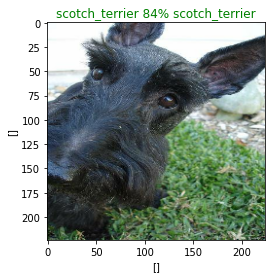

In [206]:
plot_pred(predictions,val_labels,val_images,n=1)

## this function will:

  * take an input of prediction probability array and a ground truth array and an integer
  * find the prediction using `get_pred_label()`
  * find the top 10:
     * prediction probabilites indexes
     * prediction probabilites values
     * prediction labels
  * plot the top 10 prediction probabilities values and labels ,coloring the true label green      


In [207]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

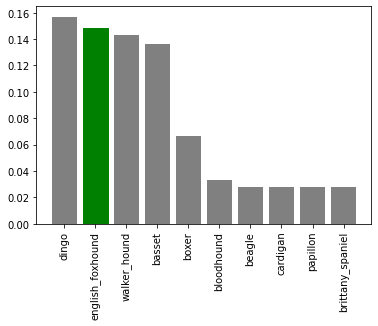

In [208]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=42)

In [209]:
len(val_labels)

200

In [210]:
predictions[0].argsort()[-10:][::-1]

array([ 70,  59,  65, 100,  98,  23,  82, 103,  17,  35])

In [211]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.27913535, 0.27770883, 0.06865766, 0.06246344, 0.03723836,
       0.03378735, 0.02985858, 0.01971799, 0.01898201, 0.01563263],
      dtype=float32)

In [212]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['lhasa', 'irish_wolfhound', 'komondor', 'shih-tzu',
       'sealyham_terrier', 'briard', 'old_english_sheepdog',
       'soft-coated_wheaten_terrier', 'border_terrier', 'dandie_dinmont'],
      dtype=object)

In [213]:
predictions[0].max()

0.27913535

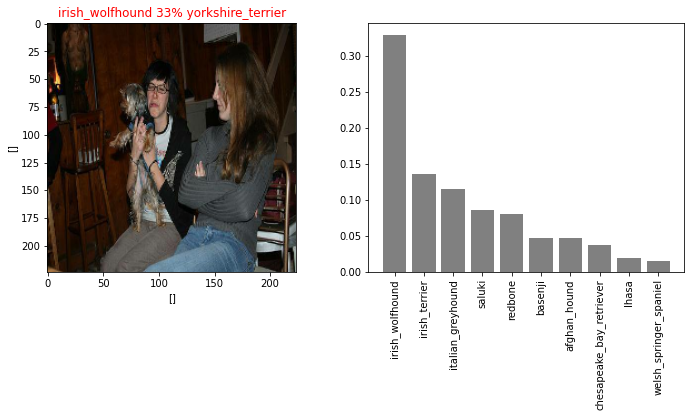

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


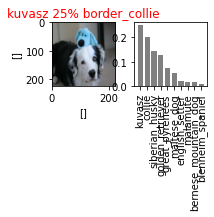

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


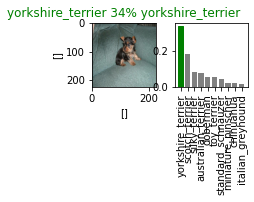

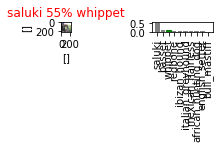

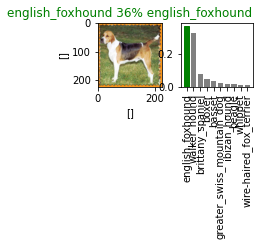

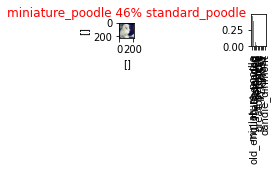

In [214]:
#let's check out a few predictions and their diffrent values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,
                labels=val_labels,
                n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()

## saving and  reloading a trained models

In [215]:
# create a function to save model
def save_model(model,suffix=None):
  """
  saves a given model in a models directory and append a suffix (string).
  """
  # create a model directory pathname with current time
  mdodeldir = os.path.join("/content/drive/MyDrive/dog-vision/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = mdodeldir + "-" + suffix + ".h5"  # save format of model
  print(f"saving model to:{model_path}...")
  model.save(model_path)
  return model_path 

In [216]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [217]:
#save model
save_model(model,suffix='1000-images-mobilenetv2-Adam')

saving model to:/content/drive/MyDrive/dog-vision/models/20220502-13011651496477-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/dog-vision/models/20220502-13011651496477-1000-images-mobilenetv2-Adam.h5'

In [218]:
# load a model
loaded_100_image_model = load_model('/content/drive/MyDrive/dog-vision/models/20220501-17591651427941-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dog-vision/models/20220501-17591651427941-1000-images-mobilenetv2-Adam.h5


In [219]:
# evaluate the loaded model
loaded_100_image_model.evaluate(val_data)

7/7 [==============================] - 3s 283ms/step - loss: 2.6453 - accuracy: 0.3850


[2.645289897918701, 0.38499999046325684]

In [220]:
model.evaluate(val_data)

7/7 [==============================] - 2s 264ms/step - loss: 2.6261 - accuracy: 0.3300


[2.6261048316955566, 0.33000001311302185]

## Training a big dog model (on full data)

In [221]:
len(x),len(y)

(10222, 10222)

In [222]:
# create a data batch with full data set
full_data = create_data_batches(x,y)

create training data batches ...


In [223]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [224]:
# create a model for full model
full_model = create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_035_224/classification/5


In [225]:
# create full model callbacks

full_model_tensorboard = create_tensorboard_callback()

# no validation set when training on all the data ,so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:**  running the cell below will take a little while (may up to 30 minute for first epoch) 
beacuse the GPU we're using in the runtime has load all of the images into memory.

In [226]:
# fit the full model to the full data
full_model.fit(x=full_data,
               epochs=num_epochs,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 110s 332ms/step - loss: 2.2005 - accuracy: 0.4452
Epoch 2/100
320/320 [==============================] - 108s 336ms/step - loss: 1.1125 - accuracy: 0.6780
Epoch 3/100
320/320 [==============================] - 109s 339ms/step - loss: 0.8352 - accuracy: 0.7476
Epoch 4/100
320/320 [==============================] - 110s 344ms/step - loss: 0.6483 - accuracy: 0.7979
Epoch 5/100
320/320 [==============================] - 111s 345ms/step - loss: 0.5134 - accuracy: 0.8455
Epoch 6/100
320/320 [==============================] - 109s 341ms/step - loss: 0.4170 - accuracy: 0.8755
Epoch 7/100
320/320 [==============================] - 109s 339ms/step - loss: 0.3392 - accuracy: 0.9019
Epoch 8/100
320/320 [==============================] - 109s 339ms/step - loss: 0.2775 - accuracy: 0.9267
Epoch 9/100
320/320 [==============================] - 109s 339ms/step - loss: 0.2223 - accuracy: 0.9460
Epoch 10/100
320/320 [==============================] -

In [227]:
save_model(full_model,suffix="full-image-mobilenetv2-adam")

saving model to:/content/drive/MyDrive/dog-vision/models/20220502-13461651499205-full-image-mobilenetv2-adam.h5...


'/content/drive/MyDrive/dog-vision/models/20220502-13461651499205-full-image-mobilenetv2-adam.h5'

In [228]:
# load full model 
loaded_full_model = load_model('/content/drive/MyDrive/dog-vision/models/20220501-19421651434163-full-image-mobilenetv2-adam.h5')

Loading saved model from: /content/drive/MyDrive/dog-vision/models/20220501-19421651434163-full-image-mobilenetv2-adam.h5


## making prediction on test dataset

since our model has been trained on images in the form of tensor batches , to make predictions on the test we will have to get into the same format

luckly we create `create_data_batches` earlier which can take a list of filename as input and convert into tensor batches.

To make prediction on the test data we will:

  * get the test image filename.
  * convert the filename into test data batch using `create_data_batches()` and setting the `test_data` parameter to true(since the test data does't have labels)
  * make a predictions array by passing the test batches to the predict() method called on our model 

In [229]:
# load test image filename
test_path = "/content/drive/MyDrive/dog-vision/test/"
test_filename = [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['/content/drive/MyDrive/dog-vision/test/e732916519751eaa0cb2ba0cc1217ab9.jpg',
 '/content/drive/MyDrive/dog-vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 '/content/drive/MyDrive/dog-vision/test/e6920cc0fd2e3099506d23761d9682e1.jpg',
 '/content/drive/MyDrive/dog-vision/test/e4369279919beecfb6d91a5375bc122f.jpg',
 '/content/drive/MyDrive/dog-vision/test/e1fa4eb8a57184773ac11efe0de11e92.jpg',
 '/content/drive/MyDrive/dog-vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/dog-vision/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 '/content/drive/MyDrive/dog-vision/test/df58b248e14af15c43fb4a3ebc00e9a3.jpg',
 '/content/drive/MyDrive/dog-vision/test/deaef21699dae3945a79dcb820b2a980.jpg',
 '/content/drive/MyDrive/dog-vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg']

In [230]:
len(test_filename)

10357

In [231]:
# create test batch
test_data = create_data_batches(test_filename,test_data=True)

create test data batches...


In [232]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

** NOte** `calling predict()` on our full model and passing it the data batch will takea long time to run(about ~1hr)

In [233]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 119s 364ms/step


In [234]:
# save prediction (numpy array) to save csv file (for access later)
np.savetxt("/content/drive/MyDrive/dog-vision/preds_array.csv",test_predictions,delimiter=',')

In [235]:
# load predication (numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/dog-vision/preds_array.csv",delimiter=',')

In [236]:
test_predictions[:10]

array([[1.02911867e-10, 2.41350884e-10, 6.12458157e-17, ...,
        3.90496449e-17, 4.21657956e-15, 2.02233202e-10],
       [2.58966494e-11, 3.43346119e-06, 3.74582526e-12, ...,
        1.92006155e-07, 5.16576004e-10, 3.25957295e-12],
       [3.43978979e-09, 9.93366740e-18, 9.01418263e-12, ...,
        1.22211442e-12, 1.20245078e-17, 2.36366287e-12],
       ...,
       [1.84666917e-01, 1.26095943e-03, 8.63034089e-09, ...,
        3.11997428e-06, 2.66581541e-04, 1.23314392e-02],
       [8.92286741e-16, 3.59674818e-10, 1.85062274e-12, ...,
        3.14974895e-04, 7.60500061e-13, 1.41498993e-15],
       [5.23768956e-22, 5.16961413e-18, 3.86219114e-15, ...,
        4.28167908e-07, 2.58039312e-10, 5.95613964e-18]])

In [237]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for kaggle

looking at the sample submission, we find that it wants our models prediction probability output in a DataFrame with an ID an a column for each diffrent dog breed.


https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we will:
 * Create a pandas DataFrame with an ID column as well as a column for each dog breed.
 * Add data to the ID column by extracting the test image ID's from their filepaths
 * Add data (the prediction probabilites) to each of the dog breed columns.
 * Export the DataFrame as a CSV to submit it to kaggle.

In [238]:
['id'] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [239]:
# create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [240]:
os.path.splitext(filenames[0])

('/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07',
 '.jpg')

In [241]:
# append test image id's to prediction dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [242]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e732916519751eaa0cb2ba0cc1217ab9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e381c5fcf1420985b20117e4bc7d38cd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e6920cc0fd2e3099506d23761d9682e1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4369279919beecfb6d91a5375bc122f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1fa4eb8a57184773ac11efe0de11e92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [243]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e732916519751eaa0cb2ba0cc1217ab9,1.029119e-10,2.413509e-10,6.124582e-17,2.489523e-18,7.530302e-14,5.054637e-12,1.342617e-12,1.588878e-12,1.036407e-07,...,1.554485e-10,1.499539e-15,1.014798e-14,9.353722e-13,1.485202e-18,2.635329e-07,2.100901e-13,3.904964e-17,4.216580e-15,2.022332e-10
1,e381c5fcf1420985b20117e4bc7d38cd,2.589665e-11,3.433461e-06,3.745825e-12,6.829624e-05,1.813623e-07,7.052813e-07,3.902687e-12,1.053339e-06,3.606376e-07,...,3.590652e-11,4.712833e-11,4.650983e-02,1.278395e-05,1.203997e-09,2.655041e-06,1.033738e-08,1.920062e-07,5.165760e-10,3.259573e-12
2,e6920cc0fd2e3099506d23761d9682e1,3.439790e-09,9.933667e-18,9.014183e-12,4.686270e-17,8.489975e-11,4.703522e-15,9.625433e-18,2.233299e-16,5.129383e-15,...,2.744008e-17,1.577257e-15,5.666439e-14,4.946578e-15,2.041243e-14,3.362310e-18,9.887507e-18,1.222114e-12,1.202451e-17,2.363663e-12
3,e4369279919beecfb6d91a5375bc122f,8.371119e-08,2.331240e-08,1.384078e-12,8.095545e-11,1.797184e-08,3.306575e-11,5.853677e-08,2.010429e-08,6.708225e-09,...,1.914362e-01,1.281935e-08,2.349533e-12,8.026363e-10,1.108069e-11,1.788041e-12,9.888430e-05,1.634904e-12,7.359258e-07,1.123731e-09
4,e1fa4eb8a57184773ac11efe0de11e92,2.074266e-06,4.136293e-13,1.741922e-13,3.775248e-10,6.977601e-13,6.423964e-16,1.873463e-09,8.785269e-10,8.624016e-20,...,1.798273e-09,2.590526e-08,4.285775e-13,2.111635e-18,2.030005e-17,3.106636e-18,4.201035e-10,1.247876e-17,5.798510e-09,5.405342e-07


In [244]:
# preds_df.to_csv for kaggle submission
preds_df.to_csv("/content/drive/MyDrive/dog-vision/full_model_prediction_submission_1_mobilenetV2.csv",
                index=False)

## making predicton on custom images

To make prediction on custom images ,we will:

* get the filepaths of our images
* turn the iflepaths into data batches using `create_data_batchs()`. And since our custom images `test_data` parameter to `True`.
* pass the custom image data batch to our model's `predict()` methods.
*convert the prediction output probabilites to predictions labels.
* compare the predicted labels to the custom images.

In [245]:
# get custom image filepaths
custom_path = "/content/drive/MyDrive/dog-vision/custom_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [246]:
custom_image_paths

['/content/drive/MyDrive/dog-vision/custom_images/intermediate2.jpg',
 '/content/drive/MyDrive/dog-vision/custom_images/1280px-American_Eskimo_Dog.jpg',
 '/content/drive/MyDrive/dog-vision/custom_images/2-dog.jpg']

In [247]:
# turn custom image into batch dataset
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

create test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [248]:
# make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [249]:
custom_preds

array([[1.38025932e-18, 4.29934838e-11, 5.80607749e-11, 1.13570806e-07,
        7.48557966e-07, 4.01251220e-11, 4.03899445e-15, 2.50927723e-10,
        6.45665951e-11, 1.05837785e-06, 3.61250607e-09, 4.04637731e-17,
        1.95584160e-10, 1.01475640e-14, 1.39059722e-10, 3.04314244e-06,
        2.03991663e-12, 1.21947849e-07, 4.66576644e-08, 1.05236983e-14,
        2.23622959e-13, 3.65430153e-09, 3.93964511e-13, 8.47916237e-10,
        4.62269418e-06, 6.46795161e-05, 2.21764579e-10, 1.59682198e-11,
        4.32653042e-06, 2.47718512e-12, 5.76237495e-12, 2.10039871e-13,
        3.94164523e-09, 6.20990481e-10, 1.13602816e-08, 5.70438445e-12,
        1.26719850e-11, 1.06522089e-08, 2.25531260e-09, 3.06363205e-07,
        1.42722345e-09, 5.41070552e-14, 8.61276328e-12, 1.47811194e-08,
        3.90035886e-11, 6.04777162e-15, 5.35029692e-08, 1.16847521e-09,
        1.72412796e-11, 6.63099054e-05, 8.85358938e-17, 1.72947894e-03,
        1.33214471e-08, 5.39035773e-06, 2.43113262e-14, 6.268045

In [250]:
custom_preds.shape

(3, 120)

In [251]:
# get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [252]:
custom_preds_labels

['labrador_retriever', 'samoyed', 'labrador_retriever']

In [253]:
# get custom images (our unbatchify() function won't work since there aren't labels)
custom_image = [] 
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_image.append(image)

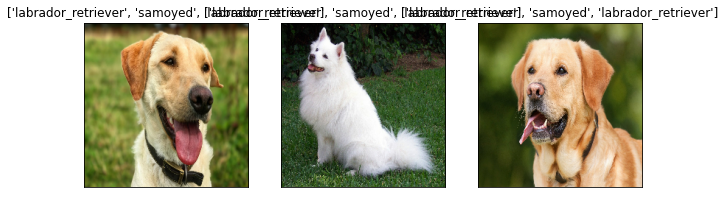

In [254]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_image):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels)
  plt.imshow(image)